## Física Computacional: Tarea 1
Profesor: Pablo Benítez Llambay

Integrantes:
- Martín Raguileo Reyes
- Fernando Zamora Carrasco

### **IMPORTANTE EJECUTAR ESTA CELDA PARA QUE SE EJECUTE EL CÓDIGO SIN PROBLEMAS**

In [1]:
import importlib
import subprocess
import sys

def install_if_missing(package, name=None):
    name = name or package
    try:
        importlib.import_module(package)
        print(f"'{package}' ya está instalado.")
    except ImportError:
        print(f"Instalando '{package}'...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", name])

# Lista de paquetes a verificar/instalar
packages = {
    "numpy": "numpy",
    "scipy": "scipy",
    "matplotlib": "matplotlib",
    "IPython": "ipython"
}

for pkg, name in packages.items():
    install_if_missing(pkg, name)

'numpy' ya está instalado.
'scipy' ya está instalado.
'matplotlib' ya está instalado.
'IPython' ya está instalado.


In [2]:
import os
import shutil
import numpy as np
from math import sqrt
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
from typing import Callable, List, Dict
from IPython.display import Video, display
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

## 1. **Introducción**

El estudio de los sistemas presa/depredador constituye un área fundamental dentro de la dinámica de poblaciones, ya que permite comprender como interactuan dos especies que dependen entre sí para su supervivencia. El modelo Lotka-Volterra es uno de los enfoques matemáticos más conocidos para describir estas interacciones a través de un sistema de ecuaciones diferenciales no lineales.


Para este proyecto se utilizan distintos métodos numéricos para la evaluación de aspectos clave dentro del modelo clásico Lotka–Volterra, como la influencia en el paso del tiempo, el análisis de la estabilidad de las soluciones, el análisis del error entre los distintos métodos implementados y la identificación de los puntos fijos del sistema. Asimismo, se realiza una exploración de la variación de parámetros para comprender cómo afectan el comportamiento de las poblaciones, se construyen diagramas de fase que permiten visualizar ciclos poblacionales y se discuten posibles extensiones del modelo.


## 2. **Marco teórico**

### Modelo de Lotka-Volterra

Para obtener las ecuaciones que describen la tasa de crecimiento de presas y depredadores, es necesario partir de un análisis aislado de cada una de las poblaciones y posteriormente realizar un analisis conjunto resultado de la interacción entre ambas poblaciones. 

Por un lado, en el caso de que no exista una capacidad de carga $K$ en el ecosistema, se presenta un crecimiento exponencial de las presas, determinado por una tasa de crecimiento en ausencia de depredadores $(\alpha)$, descrito por la siguiente ecuación:


$$x(t) = x_{0} e^{\alpha t} = x$$


por lo que su expresión diferencial, es decir, la tasa de crecimiento queda tal que: 

$$
\frac{dx}{dt} = \alpha x_{0}\, e^{\alpha t} \;\;\;\Rightarrow\;\;\; \frac{dx}{dt} = \alpha x
$$

Ahora, considerando un análisis conjunto, la población de presas se ve afectada por la depredación, lo que provoca una disminución en su número. Este efecto relaciona las poblaciones de presas y depredadores mediante una tasa de mortalidad de las presas debida a los encuentros con depredadores $(\beta)$. Finalmente, la tasa de crecimiento de las presas se expresa como:

$$\frac{dx}{dt} = \alpha x - \beta xy$$


Para la tasa de crecimiento de los depredadores, la población de depredadores ya está limitada por la disponibilidad de presas en el sistema, por lo que, considerando una caso aislado en la que no existen presas, la población presenta una disminución exponencial, determinada por una tasa de mortalidad natural de depredadores por ausencia de comida $(\gamma)$, descrito por la siguiente ecuación: 

$$y(t) = y_{0} e^{-\gamma t} = y$$


por lo que sus expresión diferencial, es decir, la tasa de disminución queda tal que:

$$
\frac{dy}{dt} = -\gamma y_{0} e^{-\gamma t} \;\;\;\Rightarrow\;\;\; \frac{dy}{dt} = -\gamma y
$$


Al igual que con las presas, considerando un análisis conjunto. Tenemos que la población de depredadores se ve afectada por la población de presas, permitiendo su proliferación gracias a la disponibilidad de alimento. Este efecto relaciona las poblaciones de presas y depredadores mediante una eficiencia de conversión de presas en nuevos depredadores $(\delta)$. Finalmente, la tasa de crecimiento de los depredadores se expresa como:


$$\frac{dy}{dt} = \delta xy - \gamma y$$


Para cada una de las constantes $\alpha$, $\beta$, $\gamma$ y $\delta$, existen formas prácticas de estimación. La primera consiste en realizar un experimento controlado en el que, en primer lugar, se analiza cada población de manera aislada para determinar $\alpha$ y $\gamma$, y posteriormente se estudia el comportamiento conjunto de ambas poblaciones para estimar $\beta$ y $\delta$. Otra manera de aproximar los valores de las constantes es obtener las series de tiempo $x(t)$ e $y(t)$ de una población real y ajustar el modelo a los datos, de modo de obtener los parámetros que mejor los expliquen. 


## 3. **Metodología**

In [3]:
# Función para modelar la tasa de población de las presas.
def prey_poblation(a: float, b: float, p: int, P: int) -> float:
    """
    Calcula la tasa de cambio de la población de presas según el modelo Lotka-Volterra.

    Parámetros:
    ----------
        a (float): Tasa de crecimiento de las presas.
        b (float): Tasa de depredación.
        p (int): Población de presas.
        P (int): Población de depredadores.

    Retorna:
    -------
        float: Tasa de cambio de la población de presas.
    """
    return (a * p) - (b * p * P)

# Función para modelar la tasa de población de los depredadores.
def depr_poblation(b: float, m: float, p: int, P: int, eps: float) -> float:
    """
    Calcula la tasa de cambio de la población de depredadores según el modelo Lotka-Volterra.

    Parámetros:
    ----------
        b (float): Tasa de depredación.
        m (float): Tasa de mortalidad de depredadores.
        p (int): Población de presas.
        P (int): Población de depredadores.
        eps (float): Eficiencia de conversión de presas en depredadores.

    Retorna:
    -------
        float: Tasa de cambio de la población de depredadores.
    """
    return (eps * b * p * P) - (m * P)

# Función para modelar la dinámica del sistema Lotka-Volterra.
def lotka_volterra(t: float, y: list[float], params: dict) -> list[float]:
    """
    Calcula las derivadas de las poblaciones de presas y depredadores en el modelo Lotka-Volterra.

    Parámetros:
    ----------
        t (float): Tiempo actual (no se usa en el cálculo).
        y (list[float]): Lista con las poblaciones actuales [presas, depredadores].
        params (dict): Diccionario con los parámetros del modelo (a, b, m, eps).

    Retorna:
    -------
        list[float]: Lista con las tasas de cambio [dp/dt, dP/dt].
    """
    p, P = y
    a, b, m, eps = params['a'], params['b'], params['m'], params['eps']

    dpdt = prey_poblation(a, b, p, P)
    dPdt = depr_poblation(b, m, p, P, eps)

    return [dpdt, dPdt]

### Funciones para los métodos numéricos

In [4]:
# Implementación del método de Euler.
def euler_step(f: Callable, t: float, y: list[float], dt: float, params: dict) -> list[float]:
    """
    Realiza un paso del método de Euler para resolver una ecuación diferencial ordinaria.

    Parámetros:
    ----------
        f (Callable): Función que calcula las derivadas.
        t (float): Tiempo actual.
        y (list[float]): Lista con los valores actuales de las variables dependientes.
        dt (float): Paso de tiempo.
        params (dict): Diccionario con parámetros adicionales para la función f.

    Retorna:
    -------
        list[float]: Lista con los nuevos valores de las variables dependientes después del paso.
    """
    dydt = f(t, y, params)
    return [y[i] + dt * dydt[i] for i in range(len(y))]

# Implementación del método de Runge-Kutta de segundo orden (RK2).
def rk2_step(f: Callable, t: float, y: list[float], dt: float, params: dict) -> list[float]:
    """
    Realiza un paso del método de Runge-Kutta de segundo orden para resolver una ecuación diferencial ordinaria.

    Parámetros:
    ----------
        f (Callable): Función que calcula las derivadas.
        t (float): Tiempo actual.
        y (list[float]): Lista con los valores actuales de las variables dependientes.
        dt (float): Paso de tiempo.
        params (dict): Diccionario con parámetros adicionales para la función f.

    Retorna:
    -------
        list[float]: Lista con los nuevos valores de las variables dependientes después del paso.
    """
    k1 = [dt * val for val in f(t, y, params)]
    k2 = [dt * val for val in f(t + dt, [y[i] + k1[i] for i in range(len(y))], params)]

    return [y[i] + (k1[i] + k2[i]) / 2 for i in range(len(y))]

# Implementación del método de Runge-Kutta de cuarto orden (RK4).
def rk4_step(f: Callable, t: float, y: list[float], dt: float, params: dict) -> list[float]:
    """
    Realiza un paso del método de Runge-Kutta de cuarto orden para resolver una ecuación diferencial ordinaria.

    Parámetros:
    ----------
        f (Callable): Función que calcula las derivadas.
        t (float): Tiempo actual.
        y (list[float]): Lista con los valores actuales de las variables dependientes.
        dt (float): Paso de tiempo.
        params (dict): Diccionario con parámetros adicionales para la función f.

    Retorna:
    -------
        list[float]: Lista con los nuevos valores de las variables dependientes después del paso.
    """
    k1 = [dt * val for val in f(t, y, params)]
    k2 = [dt * val for val in f(t + (dt/2), [y[i] + (k1[i]/2) for i in range(len(y))], params)]
    k3 = [dt * val for val in f(t + (dt/2), [y[i] + (k2[i]/2) for i in range(len(y))], params)]
    k4 = [dt * val for val in f(t + dt, [y[i] + k3[i]for i in range(len(y))], params)]

    return [y[i] + ((k1[i] + 2*k2[i] + 2*k3[i] + k4[i]) / 6) for i in range(len(y))]

### Comparación de las soluciones de los diferentes métodos numéricos.

#### Simulación del modelo Lotka-Volterra con diferentes métodos numéricos

In [5]:
# Parámetros del modelo Lotka-Volterra. Fueron elegidos de forma arbitraria.
params = {
  'a': 0.05,
  'b': 0.003,
  'm': 0.01,
  'eps': 0.02,
  'K': 1_500
}

# Condiciones iniciales: 40 presas y 25 depredadores.
p0, P0 = 40, 25
y_eu, y_rk2, y_rk4 = [p0, P0], [p0, P0], [p0, P0]

# Configuración de la simulación. Paso de tiempo y número total de pasos.
dt = 0.01
T = 50_000
steps = int(T/dt)

# Listas para almacenar los resultados.
times_eu, times_rk2, times_rk4 = [], [], []
prey_eu, prey_rk2, prey_rk4 = [], [], []
predators_eu, predators_rk2, predators_rk4 = [], [], []

t = 0
for _ in range(steps):
    # Almacenamos los tiempos para cada método.
    times_eu.append(t)
    times_rk2.append(t)
    times_rk4.append(t)

    # Almacenamos las poblaciones de presas para cada método.
    prey_eu.append(y_eu[0])
    prey_rk2.append(y_rk2[0])
    prey_rk4.append(y_rk4[0])

    # Almacenamos las poblaciones de depredadores para cada método.
    predators_eu.append(y_eu[1])
    predators_rk2.append(y_rk2[1])
    predators_rk4.append(y_rk4[1])

    # Actualizamos las poblaciones usando cada método numérico.
    y_eu = euler_step(lotka_volterra, t, y_eu, dt, params)
    y_rk2 = rk2_step(lotka_volterra, t, y_rk2, dt, params)
    y_rk4 = rk4_step(lotka_volterra, t, y_rk4, dt, params)
    t += dt

# Cálculo de las relaciones de equilibrio.
R_e = params['m'] / (params['eps'] * params['b'])
F_e = params['a'] / params['b']

#### Visualización de los resultados

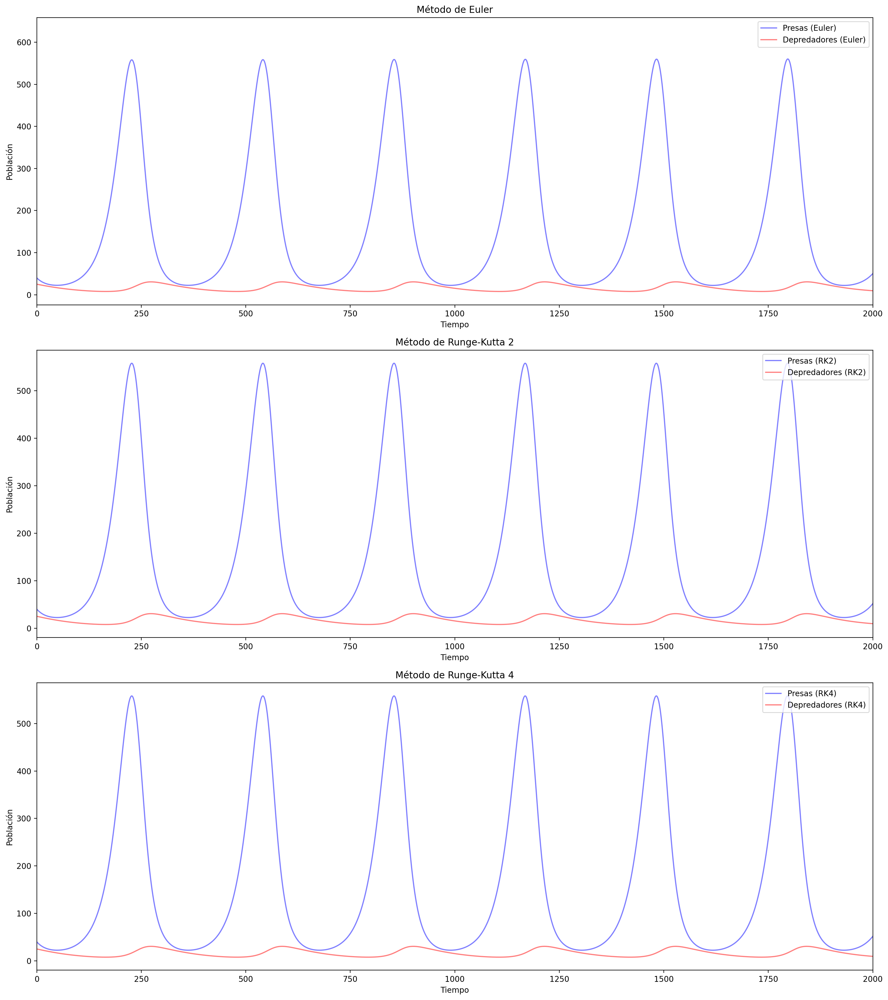

In [6]:
plt.figure(figsize=(16, 18))

plt.subplot(3, 1, 1)
plt.plot(times_eu, prey_eu, label='Presas (Euler)', color='blue', alpha=0.5)
plt.plot(times_eu, predators_eu, label='Depredadores (Euler)', color='red', alpha=0.5)
plt.xlabel('Tiempo')
plt.xlim(0, 2_000)
plt.ylabel('Población')
plt.legend(loc='upper right')
plt.title('Método de Euler')

plt.subplot(3, 1, 2)
plt.plot(times_rk2, prey_rk2, label='Presas (RK2)', color='blue', alpha=0.5)
plt.plot(times_rk2, predators_rk2, label='Depredadores (RK2)', color='red', alpha=0.5)
plt.xlabel('Tiempo')
plt.xlim(0, 2_000)
plt.ylabel('Población')
plt.legend(loc='upper right')
plt.title('Método de Runge-Kutta 2')

plt.subplot(3, 1, 3)
plt.plot(times_rk4, prey_rk4, label='Presas (RK4)', color='blue', alpha=0.5)
plt.plot(times_rk4, predators_rk4, label='Depredadores (RK4)', color='red', alpha=0.5)
plt.xlabel('Tiempo')
plt.xlim(0, 2_000)
plt.ylabel('Población')
plt.legend(loc='upper right')
plt.title('Método de Runge-Kutta 4')

plt.tight_layout()
plt.show();

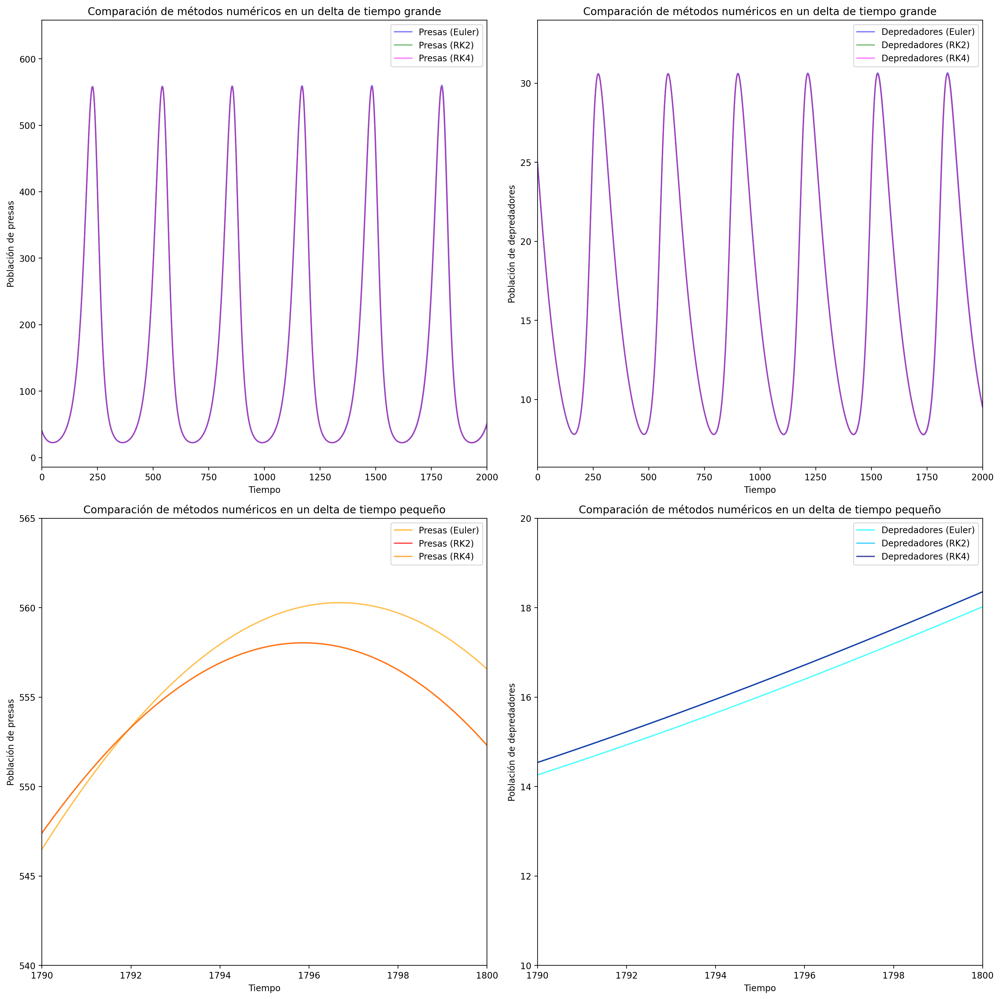

In [7]:
plt.figure(figsize=(16, 16))

plt.subplot(2, 2, 1)
plt.plot(times_eu, prey_eu, label='Presas (Euler)', color='blue', alpha=0.5)
plt.plot(times_rk2, prey_rk2, label='Presas (RK2)', color='green', alpha=0.5)
plt.plot(times_rk4, prey_rk4, label='Presas (RK4)', color='magenta', alpha=0.5)
plt.xlabel('Tiempo')
plt.xlim(0, 2_000)
plt.ylabel('Población de presas')
plt.legend(loc='upper right')
plt.title('Comparación de métodos numéricos en un delta de tiempo grande')

plt.subplot(2, 2, 2)
plt.plot(times_eu, predators_eu, label='Depredadores (Euler)', color='blue', alpha=0.5)
plt.plot(times_rk2, predators_rk2, label='Depredadores (RK2)', color='green', alpha=0.5)
plt.plot(times_rk4, predators_rk4, label='Depredadores (RK4)', color='magenta', alpha=0.5)
plt.xlabel('Tiempo')
plt.xlim(0, 2_000)
plt.ylabel('Población de depredadores')
plt.legend(loc='upper right')
plt.title('Comparación de métodos numéricos en un delta de tiempo grande')

plt.subplot(2, 2, 3)
plt.plot(times_eu, prey_eu, label='Presas (Euler)', color='orange', alpha=0.7)
plt.plot(times_rk2, prey_rk2, label='Presas (RK2)', color='red', alpha=0.7)
plt.plot(times_rk4, prey_rk4, label='Presas (RK4)', color='darkorange', alpha=0.7)
plt.xlabel('Tiempo')
plt.xlim(1_790, 1_800)
plt.ylabel('Población de presas')
plt.ylim(540, 565)
plt.yticks(np.arange(540, 566, 5))
plt.legend(loc='upper right')
plt.title('Comparación de métodos numéricos en un delta de tiempo pequeño')

plt.subplot(2, 2, 4)
plt.plot(times_eu, predators_eu, label='Depredadores (Euler)', color='cyan', alpha=0.7)
plt.plot(times_rk2, predators_rk2, label='Depredadores (RK2)', color='deepskyblue', alpha=0.7)
plt.plot(times_rk4, predators_rk4, label='Depredadores (RK4)', color='navy', alpha=0.7)
plt.xlabel('Tiempo')
plt.xlim(1_790, 1_800)
plt.ylabel('Población de depredadores')
plt.ylim(10, 20)
plt.legend(loc='upper right')
plt.title('Comparación de métodos numéricos en un delta de tiempo pequeño')

plt.tight_layout()
plt.show();

En las sumulaciones se compararon 3 métodos de integración numérica: Euler, Runge-Kutta de orden 2 $(RK2)$ y Runge-Kutta de orden 4 $(RK4)$ respecto a un $\Delta t$ grande y uno pequeño, con el fin de obtener una visión macro y micro de las curvas en función del tiempo.

Para un intervalo de tiempo grande se observa que los 3 métodos producen oscilaciones periódicas en las poblaciones de presas y depredadores, en donde todos los métodos describen el mismo comportamiento, con variaciones que a esa escala no se perciben. Las curvas, a simple vista, se superponen mostrando trayectorias similares, esto es a pesar de la diferencia en la presición de los métodos, dado que incluso el método con menos presición (Euler) logra capturar satisfactoriamente la dinámica general del sistema.

En un intervalo de tiempo más pequeño, para una mirada más local de las curvas, las variaciones y diferencias entre los métodos se hacen más evidentes. A una escala local, el método de Euler suele sobreestimar o subestimar en comparación con los métodos de Runge–Kutta. Respecto a estos dos últimos, a pesar de ser de distinto orden, presentan una superposición que los hace prácticamente indistinguibles en ese rango de valores de $t$.


##### Funciones auxiliares para la animación.

In [ ]:
# Con la ayuda de ChatGPT con pensamiento.
def simulate_for_animation(params: dict, p0: float, P0: float, dt: float, T_anim: float, frames_target: int = 1000, clip_negative: bool = False) -> dict[str, np.ndarray]:
    steps = int(np.ceil(T_anim / dt))
    save_every = max(1, steps // frames_target)
    times = []
    prey_eu = []; prey_rk2 = []; prey_rk4 = []
    pred_eu = []; pred_rk2 = []; pred_rk4 = []

    y_eu = [p0, P0]; y_rk2 = [p0, P0]; y_rk4 = [p0, P0]
    t = 0.0
    for step in range(steps + 1):
        if step % save_every == 0:
            times.append(t)
            prey_eu.append(y_eu[0]); prey_rk2.append(y_rk2[0]); prey_rk4.append(y_rk4[0])
            pred_eu.append(y_eu[1]); pred_rk2.append(y_rk2[1]); pred_rk4.append(y_rk4[1])

        # un paso
        y_eu = euler_step(lotka_volterra, t, y_eu, dt, params)
        y_rk2 = rk2_step(lotka_volterra, t, y_rk2, dt, params)
        y_rk4 = rk4_step(lotka_volterra, t, y_rk4, dt, params)

        if clip_negative:
            y_eu = [max(0.0, v) for v in y_eu]
            y_rk2 = [max(0.0, v) for v in y_rk2]
            y_rk4 = [max(0.0, v) for v in y_rk4]

        t += dt

    return {
        'times': np.array(times),
        'prey_eu': np.array(prey_eu),'prey_rk2': np.array(prey_rk2),'prey_rk4': np.array(prey_rk4),
        'pred_eu': np.array(pred_eu),'pred_rk2': np.array(pred_rk2),'pred_rk4': np.array(pred_rk4),
    }

def make_animation_prey(params, p0, P0, dt=0.01, T_anim=200.0, frames_target=600, clip_negative=False, fps=15, zoom_window=20.0, figsize=(10,4)) -> FuncAnimation:
    data = simulate_for_animation(params, p0, P0, dt, T_anim, frames_target, clip_negative)
    times = data['times']
    N = len(times)

    fig, (ax_full, ax_zoom) = plt.subplots(1,2, figsize=figsize)
    fig.suptitle(f'Presas: Euler / RK2 / RK4 (dt={dt}, T={T_anim})')

    # --- full plot (serie completa) ---
    line_full_eu, = ax_full.plot([], [], lw=1, alpha=0.6, label='Euler')
    line_full_rk2, = ax_full.plot([], [], lw=1, alpha=0.8, label='RK2')
    line_full_rk4, = ax_full.plot([], [], lw=1, alpha=0.9, label='RK4')
    mark_full_eu, = ax_full.plot([], [], marker='o', ms=5, alpha=0.6)
    mark_full_rk2, = ax_full.plot([], [], marker='o', ms=5, alpha=0.8)
    mark_full_rk4, = ax_full.plot([], [], marker='o', ms=5, alpha=0.9)

    ax_full.set_xlabel('Tiempo'); ax_full.set_ylabel('Población de presas')
    ax_full.legend(loc='upper right')
    ax_full.set_xlim(times[0], times[-1])

    # y-limits según datos (añadimos pequeño padding)
    ymin = min(data['prey_eu'].min(), data['prey_rk2'].min(), data['prey_rk4'].min())
    ymax = max(data['prey_eu'].max(), data['prey_rk2'].max(), data['prey_rk4'].max())
    ax_full.set_ylim(max(0, ymin*0.9), ymax*1.1)

    # --- zoom plot (ventana móvil en tiempo) ---
    line_zoom_eu, = ax_zoom.plot([], [], lw=1, alpha=0.6, label='Euler')
    line_zoom_rk2, = ax_zoom.plot([], [], lw=1, alpha=0.8, label='RK2')
    line_zoom_rk4, = ax_zoom.plot([], [], lw=1, alpha=0.9, label='RK4')
    mark_zoom_eu, = ax_zoom.plot([], [], marker='o', ms=6, alpha=0.6)
    mark_zoom_rk2, = ax_zoom.plot([], [], marker='o', ms=6, alpha=0.8)
    mark_zoom_rk4, = ax_zoom.plot([], [], marker='o', ms=6, alpha=0.9)
    ax_zoom.set_xlabel('Tiempo'); ax_zoom.set_ylabel('Población (zoom)')
    ax_zoom.legend(loc='upper right')

    def init():
        for ln in [line_full_eu, line_full_rk2, line_full_rk4,
                   mark_full_eu, mark_full_rk2, mark_full_rk4,
                   line_zoom_eu, line_zoom_rk2, line_zoom_rk4,
                   mark_zoom_eu, mark_zoom_rk2, mark_zoom_rk4]:
            ln.set_data([], [])
        return (line_full_eu, line_full_rk2, line_full_rk4,
                mark_full_eu, mark_full_rk2, mark_full_rk4,
                line_zoom_eu, line_zoom_rk2, line_zoom_rk4,
                mark_zoom_eu, mark_zoom_rk2, mark_zoom_rk4)

    def update(frame):
        # frame corresponde al índice en arrays muestreados
        t_all = times
        t_current = times[frame]

        # series hasta el frame actual (para la gráfica completa)
        t = t_all[:frame+1]
        p_eu = data['prey_eu'][:frame+1]
        p_rk2 = data['prey_rk2'][:frame+1]
        p_rk4 = data['prey_rk4'][:frame+1]

        # actualizar full (izquierda)
        line_full_eu.set_data(t, p_eu)
        line_full_rk2.set_data(t, p_rk2)
        line_full_rk4.set_data(t, p_rk4)
        mark_full_eu.set_data([t_current], [data['prey_eu'][frame]])
        mark_full_rk2.set_data([t_current], [data['prey_rk2'][frame]])
        mark_full_rk4.set_data([t_current], [data['prey_rk4'][frame]])

        # --- Ventana móvil centrada en t_current (derecha) ---
        # Define ventana centrada
        half_win = zoom_window / 2.0
        t0 = t_current - half_win
        t1 = t_current + half_win

        # clamp a límites de los datos
        t_min_all, t_max_all = t_all[0], t_all[-1]
        if t0 < t_min_all:
            t0 = t_min_all
            t1 = t_min_all + zoom_window
        if t1 > t_max_all:
            t1 = t_max_all
            t0 = max(t_min_all, t_max_all - zoom_window)

        # mascara para datos dentro de la ventana centrada
        t_mask = (t_all >= t0) & (t_all <= t1)
        times_zoom = t_all[t_mask]

        # datos correspondientes al zoom (podrían estar más espaciados si muestreaste)
        p_eu_zoom = data['prey_eu'][t_mask]
        p_rk2_zoom = data['prey_rk2'][t_mask]
        p_rk4_zoom = data['prey_rk4'][t_mask]

        # actualizar líneas del zoom
        line_zoom_eu.set_data(times_zoom, p_eu_zoom)
        line_zoom_rk2.set_data(times_zoom, p_rk2_zoom)
        line_zoom_rk4.set_data(times_zoom, p_rk4_zoom)
        mark_zoom_eu.set_data([t_current], [data['prey_eu'][frame]])
        mark_zoom_rk2.set_data([t_current], [data['prey_rk2'][frame]])
        mark_zoom_rk4.set_data([t_current], [data['prey_rk4'][frame]])

        # --- Ajuste dinámico de límites Y para centrar el punto ---
        # Parámetros que puedes ajustar (si los mueves a la firma, podrás controlarlos desde fuera)
        zoom_y_factor = 0.6   # 0.6 -> la mitad (60%) del rango local; menor => zoom más apretado verticalmente
        min_zoom_y = 0.5      # límite mínimo para el semi-rango Y (evita 0)

        if len(p_eu_zoom) > 0:
            # rango local observado
            local_y_min = min(p_eu_zoom.min(), p_rk2_zoom.min(), p_rk4_zoom.min())
            local_y_max = max(p_eu_zoom.max(), p_rk2_zoom.max(), p_rk4_zoom.max())
            local_range = max(1e-8, local_y_max - local_y_min)

            # centro vertical: puedes usar la media local o el valor actual. Aquí usamos el valor actual promedio entre métodos
            cur_y_vals = np.array([data['prey_eu'][frame], data['prey_rk2'][frame], data['prey_rk4'][frame]])
            y_center = float(np.mean(cur_y_vals))

            # semi-rango vertical deseado: proporcional al rango local pero centrado en y_center
            half_y = max(min_zoom_y, (local_range * zoom_y_factor) / 2.0)

            # límites Y centrados en y_center (evitan negativos)
            y0 = max(0.0, y_center - half_y)
            y1 = y_center + half_y

            # si la ventana vertical queda demasiado pequeña en relación a los datos (p. ej. todos iguales), ampliar un poco
            if (y1 - y0) < 1e-3:
                y0 = max(0.0, y_center - min_zoom_y)
                y1 = y_center + min_zoom_y

            ax_zoom.set_xlim(t0, t1)
            ax_zoom.set_ylim(y0, y1)

        else:
            # fallback si no hay datos en la ventana (raro)
            ax_zoom.set_xlim(t0, t1)

        return (line_full_eu, line_full_rk2, line_full_rk4,
                mark_full_eu, mark_full_rk2, mark_full_rk4,
                line_zoom_eu, line_zoom_rk2, line_zoom_rk4,
                mark_zoom_eu, mark_zoom_rk2, mark_zoom_rk4)

    ani = animation.FuncAnimation(fig, update, frames=N, init_func=init, blit=False, interval=1000/fps)
    plt.tight_layout()
    return ani

##### Visualización de la animación.

In [9]:
params = {
  'a': 0.05,
  'b': 0.003,
  'm': 0.01,
  'eps': 0.02,
}

p0, P0 = 40.0, 25.0

# Parámetros para la animación
dt = 0.1
T_anim = 400.0
frames_target = 480
fps = 24
bitrate = 4_000
dpi = 150
zoom_window = 30.0
clip_negative = True

# Generar la animación
ani = make_animation_prey(params, p0, P0, dt=dt, T_anim=T_anim,
                         frames_target=frames_target, clip_negative=clip_negative,
                         fps=fps, zoom_window=zoom_window, figsize=(12, 6))

# Guardar la animación en un archivo MP4
part1_animation_fname = 'media/prey_zoom.mp4' # Nombre del archivo de salida

# Verifica que ffmpeg esté disponible
ff = shutil.which('ffmpeg')
if ff is None:
  raise RuntimeError("ffmpeg no encontrado en PATH. " \
  "Ejecuta 'where ffmpeg' en CMD o añade la ruta a mpl.rcParams['animation.ffmpeg_path'].")

# Guardar usando FFMpegWriter
writer = animation.FFMpegWriter(fps=fps, bitrate=bitrate)
ani.save(part1_animation_fname, writer=writer, dpi=dpi)
size = os.path.getsize(part1_animation_fname) / (1024*1024)
print(f"Animación guardada en '{part1_animation_fname}' con tamaño {size:.2f} MB.")
plt.close()

Animación guardada en 'media/prey_zoom.mp4' con tamaño 5.96 MB.


In [10]:
display(Video('media/prey_zoom.mp4', embed=True, width=1200))

## 2. **Análisis del Paso de Tiempo**

In [11]:
def simulate_compare(params: dict, p0: float, P0: float, dt_list: list[float], T: float, save_max_points: int = 10000, clip_negative: bool = False):
    results = {}
    for dt_i in dt_list:
        steps = int(T / dt_i)
        # advertencia si demasiados pasos
        if steps > 5_000_000:
            print(f"Warning: dt={dt_i} -> steps={steps} (muy grande). Considera reducir T o aumentar dt.")
        # decidir cada cuantos pasos guardo (muestreo)
        save_every = max(1, steps // save_max_points)

        # reiniciar condiciones para este dt
        y_eu = [p0, P0]
        y_rk2 = [p0, P0]
        y_rk4 = [p0, P0]

        times = []
        prey_eu = []; prey_rk2 = []; prey_rk4 = []
        pred_eu = []; pred_rk2 = []; pred_rk4 = []

        t = 0.0
        for step in range(steps):
            # guardar cada save_every pasos (incluyendo t=0)
            if step % save_every == 0:
                times.append(t)
                prey_eu.append(y_eu[0])
                prey_rk2.append(y_rk2[0])
                prey_rk4.append(y_rk4[0])
                pred_eu.append(y_eu[1])
                pred_rk2.append(y_rk2[1])
                pred_rk4.append(y_rk4[1])

            # dar un paso
            y_eu = euler_step(lotka_volterra, t, y_eu, dt_i, params)
            y_rk2 = rk2_step(lotka_volterra, t, y_rk2, dt_i, params)
            y_rk4 = rk4_step(lotka_volterra, t, y_rk4, dt_i, params)

            if clip_negative:
                y_eu = [max(0.0, v) for v in y_eu]
                y_rk2 = [max(0.0, v) for v in y_rk2]
                y_rk4 = [max(0.0, v) for v in y_rk4]

            t += dt_i

        results[f"dt_{dt_i}"] = {
            'times': times,
            'prey_eu': prey_eu, 'prey_rk2': prey_rk2, 'prey_rk4': prey_rk4,
            'pred_eu': pred_eu, 'pred_rk2': pred_rk2, 'pred_rk4': pred_rk4,
            'save_every': save_every,
            'steps': steps
        }
    return results

params = {
  'a': 0.05,
  'b': 0.003,
  'm': 0.01,
  'eps': 0.02,
}

p0, P0 = 40, 25
dt = [0.5, 0.1, 0.01, 0.001]
T = 5_000
results = simulate_compare(params, p0, P0, dt, T, save_max_points=2000, clip_negative=True)

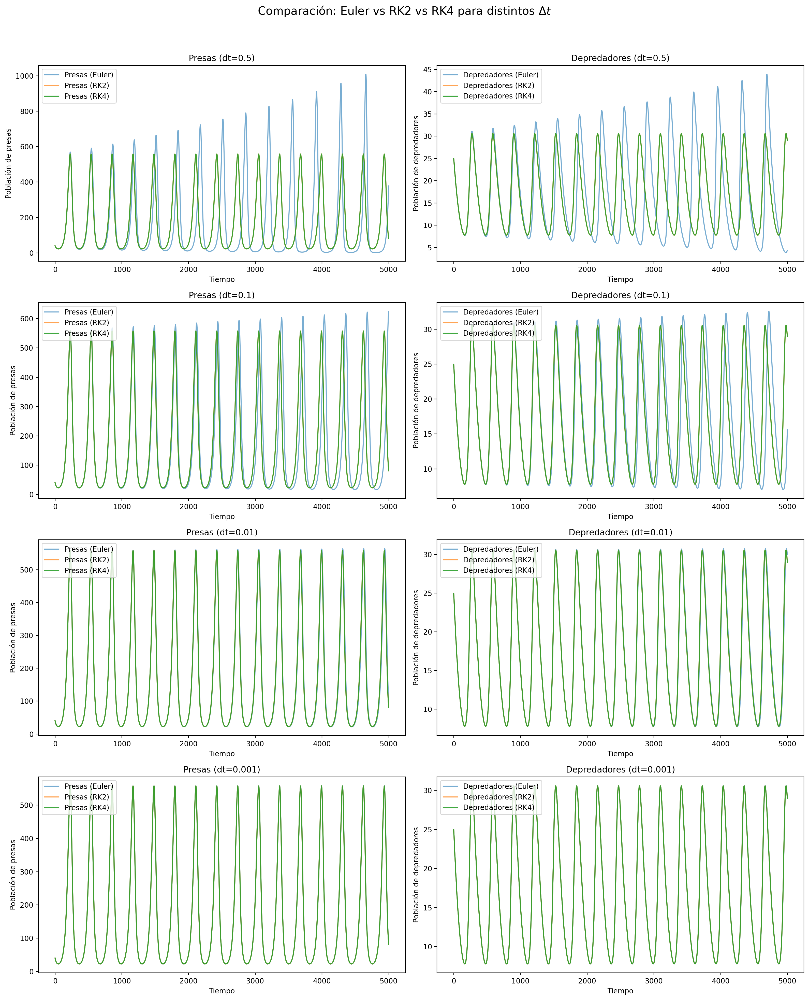

In [12]:
n = len(dt)
fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(16, 5*n), sharex=False)
fig.suptitle(r'Comparación: Euler vs RK2 vs RK4 para distintos $\Delta t$', fontsize=16)

for i, dt_i in enumerate(dt):
    res = results[f"dt_{dt_i}"]
    times = res['times']
    prey_eu = res['prey_eu']
    prey_rk2 = res['prey_rk2']
    prey_rk4 = res['prey_rk4']
    pred_eu = res['pred_eu']
    pred_rk2 = res['pred_rk2']
    pred_rk4 = res['pred_rk4']

    ax_prey = axes[i, 0] if n > 1 else axes[0]
    ax_pred = axes[i, 1] if n > 1 else axes[1]

    ax_prey.plot(times, prey_eu, label='Presas (Euler)', alpha=0.6)
    ax_prey.plot(times, prey_rk2, label='Presas (RK2)', alpha=0.7)
    ax_prey.plot(times, prey_rk4, label='Presas (RK4)', alpha=0.9)
    ax_prey.set_ylabel('Población de presas')
    ax_prey.set_title(f'Presas (dt={dt_i})')
    ax_prey.legend(loc='upper left')

    ax_pred.plot(times, pred_eu, label='Depredadores (Euler)', alpha=0.6)
    ax_pred.plot(times, pred_rk2, label='Depredadores (RK2)', alpha=0.7)
    ax_pred.plot(times, pred_rk4, label='Depredadores (RK4)', alpha=0.9)
    ax_pred.set_ylabel('Población de depredadores')
    ax_pred.set_title(f'Depredadores (dt={dt_i})')
    ax_pred.legend(loc='upper left')

for ax in fig.axes:
    ax.set_xlabel('Tiempo')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

En el análisis de la influencia de $\Delta t$, se observa que su elección impacta directamente en la estabilidad y fidelidad de las soluciones obtenidas. Se pueden observar distintas curvas asociadas a ambas poblaciones para los valores 0.5, 0.1, 0.01 y 0.001 de $\Delta t$.

Para $\Delta t = 0.5$, el método de Euler comienza a desviarse notoriamente respecto a los métodos de Runge-Kutta. Las desviaciones generan oscilaciones con amplitudes no realistas y acumulación de error a lo largo del tiempo. Por otro lado, $RK2$ y $RK4$ mantienen trayectorias mucho más estables y cercanas entre sí, capturando la dinámica poblacional esperada del sistema. 

Para $\Delta t = 0.1$ las diferencias entre lo métodos disminuyen, aunque aún se aprecian discrepancias entre Euler y los métodos de mayor orden

Para $\Delta t$ más pequeños, como 0.01 y 0.001, las soluciones obtenidas con los 3 métodos son casi indistinguibles y describen practicamente las mismas curvas de poblaciones. A esta escala el método de Euler logra describir de manera adecuada la dinámica esperada del modelo, aunque con menos precisión que lo modelos de Runge-Kutta, tal como se mencionó en el inciso anterior (En la que se utilizó un $\Delta t = 0.01$). 

## 3. **Análisis de Error**

In [17]:
def simulate_single(method_step: Callable, params: dict, y0: List[float], 
                    dt: float, T: float, clip_negative: bool=False) -> tuple[np.ndarray, np.ndarray]:
    steps = int(np.floor(T / dt))
    times = np.linspace(0.0, steps * dt, steps + 1)
    y = list(y0)
    traj = np.zeros((steps + 1, 2))
    traj[0, :] = y
    t = 0.0

    for i in range(1, steps+1):
        y = method_step(lotka_volterra, t, y, dt, params)
        
        if clip_negative:
            y = [max(0.0, v) for v in y]

        t += dt
        traj[i, :] = y

    return times, traj

def instant_error(y_ref: np.ndarray, y_method: np.ndarray) -> np.ndarray:
    diff = y_ref - y_method
    l2 = np.sqrt(np.sum(diff**2, axis=1))

    return l2

def compare_methods(params: dict, y0: list[float], dt: float, T: float, clip_negative: bool=False,
                    solver_method: str='DOP853', rtol: float=1e-13, atol: float=1e-15) -> dict[str, any]:
    times, traj_eu = simulate_single(euler_step, params, y0, dt, T, clip_negative=clip_negative)
    _, traj_rk2 = simulate_single(rk2_step, params, y0, dt, T, clip_negative=clip_negative)
    _, traj_rk4 = simulate_single(rk4_step, params, y0, dt, T, clip_negative=clip_negative)

    t0 = 0.0
    tf = times[-1]
    def f_wrap(t: float, y: np.ndarray) -> np.ndarray:
        return np.array(lotka_volterra(t, list(y), params), dtype=float)
    
    sol = solve_ivp(fun=f_wrap, t_span=(0, T), y0=y0, method=solver_method,
                    t_eval=times, rtol=rtol, atol=atol)
    
    if not sol.success:
        raise RuntimeError("solve_ivp falló: " + str(sol.message))
    
    traj_ref = sol.y.T

    err_eu = instant_error(traj_ref, traj_eu)
    err_rk2 = instant_error(traj_ref, traj_rk2)
    err_rk4 = instant_error(traj_ref, traj_rk4)

    stats = {
        'dt': dt,
        'times': times,
        'traj_ref': traj_ref,
        'traj_eu': traj_eu, 'traj_rk2': traj_rk2, 'traj_rk4': traj_rk4,
        'err_eu': err_eu, 'err_rk2': err_rk2, 'err_rk4': err_rk4,
        'mean_err': (np.mean(err_eu), np.mean(err_rk2), np.mean(err_rk4)),
        'max_err': (np.max(err_eu), np.max(err_rk2), np.max(err_rk4)),
        'rms_err': (np.sqrt(np.mean(err_eu**2)), np.sqrt(np.mean(err_rk2**2)), np.sqrt(np.mean(err_rk4**2))),
    }

    return stats

In [18]:
params = {
  'a': 0.05,
  'b': 0.003,
  'm': 0.01,
  'eps': 0.02,
  'K': 1_500
}

p0, P0 = 40, 25
y0 = [p0, P0]
T = 200

dt_list = [0.5, 0.1, 0.05, 0.01, 0.005, 0.001, 0.0005, 0.0001]
results = []

for dt in dt_list:
    stats = compare_methods(params, y0, dt, T, clip_negative=False)
    results.append(stats)
    print('dt:', dt)
    print('Error cuadrático medio (Euler, RK2, RK4):', np.round(stats['rms_err'], 16))

    if dt != dt_list[-1]:
        print()

dt: 0.5
Error cuadrático medio (Euler, RK2, RK4): [1.27711468e+00 7.76953133e-04 3.72545041e-08]

dt: 0.1
Error cuadrático medio (Euler, RK2, RK4): [2.52009017e-01 3.15233002e-05 7.67321000e-11]

dt: 0.05
Error cuadrático medio (Euler, RK2, RK4): [1.25790889e-01 7.89518731e-06 3.80723000e-11]

dt: 0.01
Error cuadrático medio (Euler, RK2, RK4): [2.51239920e-02 3.16270385e-07 3.64887000e-11]

dt: 0.005
Error cuadrático medio (Euler, RK2, RK4): [1.25598592e-02 7.90822838e-08 3.77519000e-11]

dt: 0.001
Error cuadrático medio (Euler, RK2, RK4): [2.51162995e-03 3.16619450e-09 3.67553000e-11]

dt: 0.0005
Error cuadrático medio (Euler, RK2, RK4): [1.2557936e-03 7.8483760e-10 3.7035900e-11]

dt: 0.0001
Error cuadrático medio (Euler, RK2, RK4): [2.51155327e-04 5.94409000e-11 4.07734000e-11]


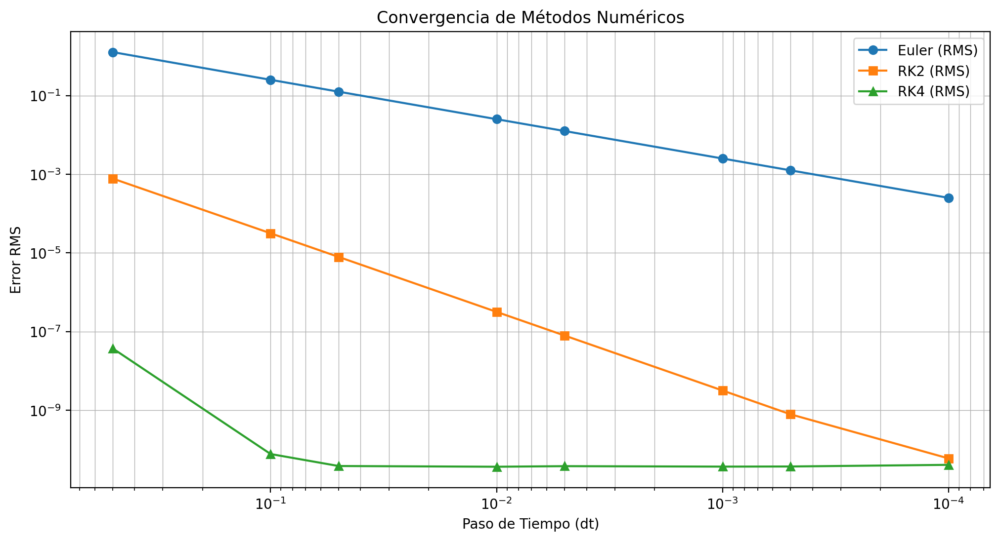

In [19]:
dt_vals = [res['dt'] for res in results]
rms_eu = [res['rms_err'][0] for res in results]
rms_rk2 = [res['rms_err'][1] for res in results]
rms_rk4 = [res['rms_err'][2] for res in results]

plt.figure(figsize=(12, 6))
plt.plot(dt_vals, rms_eu, 'o-', label='Euler (RMS)')
plt.plot(dt_vals, rms_rk2, 's-', label='RK2 (RMS)')
plt.plot(dt_vals, rms_rk4, '^-', label='RK4 (RMS)')
plt.gca().invert_xaxis()
plt.xlabel('Paso de Tiempo (dt)')
plt.xscale('log')
plt.ylabel('Error RMS')
plt.yscale('log')
plt.title('Convergencia de Métodos Numéricos')
plt.legend()
plt.grid(True, which="both", linewidth=0.5)
plt.show();

In [20]:
def local_orders(dt_vals, errs):
    orders = []
    for i in range(len(dt_vals)-1):
        h1, h2 = dt_vals[i], dt_vals[i+1]
        e1, e2 = errs[i], errs[i+1]
        if e1>0 and e2>0:
            p = np.log(e1/e2)/np.log(h1/h2)
        else:
            p = np.nan
        orders.append(p)
    return np.array(orders)

orders_eu = local_orders(dt_vals, rms_eu)
orders_rk2 = local_orders(dt_vals, rms_rk2)
orders_rk4 = local_orders(dt_vals, rms_rk4)

for name, ords in [('Euler', orders_eu), ('RK2', orders_rk2), ('RK4', orders_rk4)]:
    print(f"Órdenes locales de convergencia para {name}:")
    
    for i, p in enumerate(ords):
        print(f"-> Entre dt={dt_vals[i]} y dt={dt_vals[i+1]}: p ≈ {p:.2f}")
    
    if name != 'RK4':
        print()

Órdenes locales de convergencia para Euler:
-> Entre dt=0.5 y dt=0.1: p ≈ 1.01
-> Entre dt=0.1 y dt=0.05: p ≈ 1.00
-> Entre dt=0.05 y dt=0.01: p ≈ 1.00
-> Entre dt=0.01 y dt=0.005: p ≈ 1.00
-> Entre dt=0.005 y dt=0.001: p ≈ 1.00
-> Entre dt=0.001 y dt=0.0005: p ≈ 1.00
-> Entre dt=0.0005 y dt=0.0001: p ≈ 1.00

Órdenes locales de convergencia para RK2:
-> Entre dt=0.5 y dt=0.1: p ≈ 1.99
-> Entre dt=0.1 y dt=0.05: p ≈ 2.00
-> Entre dt=0.05 y dt=0.01: p ≈ 2.00
-> Entre dt=0.01 y dt=0.005: p ≈ 2.00
-> Entre dt=0.005 y dt=0.001: p ≈ 2.00
-> Entre dt=0.001 y dt=0.0005: p ≈ 2.01
-> Entre dt=0.0005 y dt=0.0001: p ≈ 1.60

Órdenes locales de convergencia para RK4:
-> Entre dt=0.5 y dt=0.1: p ≈ 3.84
-> Entre dt=0.1 y dt=0.05: p ≈ 1.01
-> Entre dt=0.05 y dt=0.01: p ≈ 0.03
-> Entre dt=0.01 y dt=0.005: p ≈ -0.05
-> Entre dt=0.005 y dt=0.001: p ≈ 0.02
-> Entre dt=0.001 y dt=0.0005: p ≈ -0.01
-> Entre dt=0.0005 y dt=0.0001: p ≈ -0.06


El análisis de error se realizó comparando las soluciones obtenidas mediante los métodos de Euler, $RK2$ y $RK4$ respecto a una solución de referencia generada por un integrador de mayor orden, específicamente, un método Runge-Kutta 8 (DOP853) con tolerancias estrictas. Luego, la solución de referencia se evaluó en los mismos instantes de tiempo que las soluciones numéricas y se calculó el error mediante la norma RMS (raíz del error cuadrático medio). Por último se realizó un gráfico log-log del error en función de $\Delta t$ y las pendientes en diferentes puntos de cada curva, notando los errores característicos asociados a los modelos.

Para el método de Euler, se observa una pendiente $p$ cercana a 1 a lo largo de la función, que es coherente respecto a su orden y que decrece linealmente respecto a $\Delta t$, haciendolo el método con precisión más bajo necesitando pasos muy pequeños para alcanzar errores aceptables.

Para el método Runge-Kutta de orden 2 tenemos que la pendiente $p \approx 2$, que es consistente con el decrecimiento cuadrático respecto a $\Delta t$ (decrece proporcionalmente a $(\Delta t)^2$), lo que lo hace mucho más preciso que el método de Euler.

Por último, para el método Runge–Kutta de orden 4 se observa en primera instancia que el error decrece proporcionalmente a $(\Delta t)^4$, con $p \approx 4$, para luego estabilizarse cuando $\Delta t > 0.1$. Esto evidencia que este método es más preciso que los dos mencionados anteriormente, mostrando un error considerablemente menor con pasos de integración relativamente grandes y una tasa de disminución mayor que la del método de Euler y $RK2$ con $\Delta t$ más pequeños. Finalmente, la reducción del error se ve limitada por la precisión numérica de la máquina (error de redondeo), lo que explica la saturación en la parte baja de la curva.




## 4. **Diagrama de Fase**

## 5. **Análisis de Parámetros**

## 6. **Conclusiones**